## The Project
---

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

The images for camera calibration are stored in the folder called `camera_cal`.  The images in `test_images` are for testing your pipeline on single frames.  If you want to extract more test images from the videos, you can simply use an image writing method like `cv2.imwrite()`, i.e., you can read the video in frame by frame as usual, and for frames you want to save for later you can write to an image file.  

To help the reviewer examine your work, please save examples of the output from each stage of your pipeline in the folder called `ouput_images`, and include a description in your writeup for the project of what each image shows.    The video called `project_video.mp4` is the video your pipeline should work well on.  

The `challenge_video.mp4` video is an extra (and optional) challenge for you if you want to test your pipeline under somewhat trickier conditions.  The `harder_challenge.mp4` video is another optional challenge and is brutal!

If you're feeling ambitious (again, totally optional though), don't stop there!  We encourage you to go out and take video of your own, calibrate your camera and show us how you would implement this project from scratch!


## Camera Calibration

In [1]:
# Load nessesery modules and set up
import cv2
import glob
import pickle
import numpy as np
import matplotlib
matplotlib.use('TkAgg')
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.metrics import mean_squared_error
%matplotlib inline

We use the built in openCV function "findChessBoardCorners" to detect the
number of intersections in the supplies images taken from the camera we wish to calibrate. 

Since we have many images in a single directory glob is used to iterate over every image

Since this function requires a grey scale image, the images are converted from RGB to gray scale first.

The corners are detected and the images are ploted with the detection overlayed using the drawChessBoardCorners function in openCV. Images that corners can not be detected on are identified and ploted as well for information.


Corners were found on 17 out of 20 it is 85.0 % of calibration images


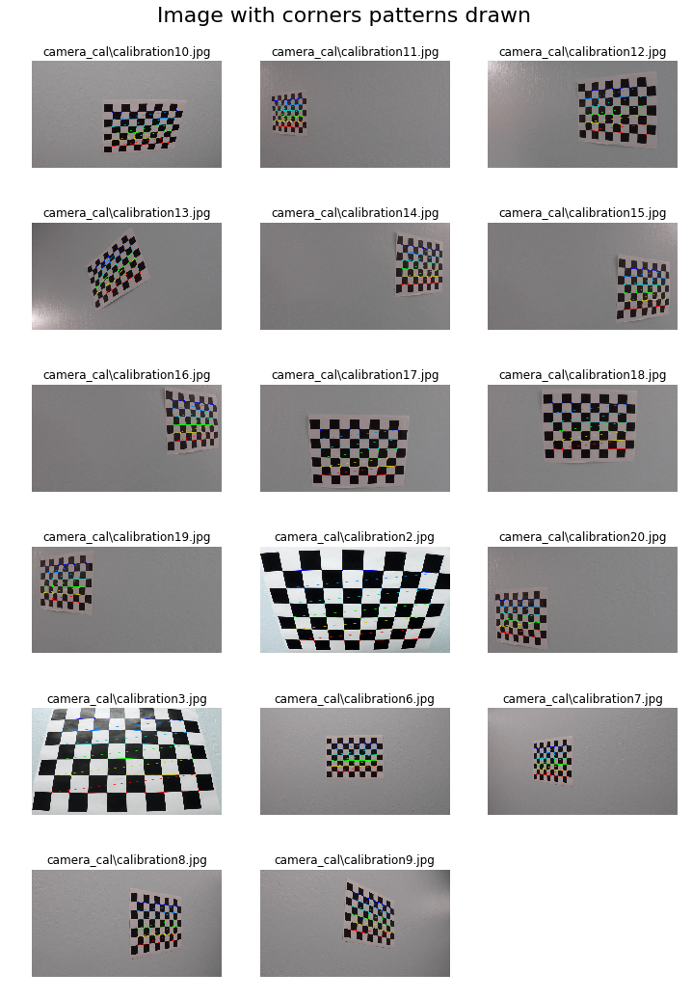

In [2]:
# Identify the number of intersecting points on the chess board along the
# x and y
x_chess_dim = 9 #Number of corners to find
y_chess_dim = 6


# We define the real world coordinates of each point as an (x,y,z)
# coordinate. This will be stored in a vector of object points (objp)
# Prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((y_chess_dim*x_chess_dim,3), np.float32) #initialize to zeros


#Use mgrid to make an array that has a sequence of numbers, X 
#dimension will be 0:X_ches_dim, y will be 0 to y_chess_dim, Z will 
#be zero for all points.

#mgrid will return a row vectors, but we want colum vectors, fo we take
#the transpose and reshape it to be colum vectors, so we take the Transpose
# with .T, this will return a mxn array, but we want an mx2 array
# so we reshape, the -1 meanse infer from the dataset the size
objp[:,:2] = np.mgrid[0:x_chess_dim, 0:y_chess_dim].T.reshape(-1,2)


# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.


images = glob.glob('camera_cal/calibration*.jpg') # Make a list of paths to calibration images
# Step through the list and search for chessboard corners
corners_not_found = [] #Calibration images in which opencv failed to find corners

#Setup Initial subplt
plt.figure(figsize=(12, 18)) #Figure for calibration images
plt.figtext(0.5,0.9,'Image with corners patterns drawn', fontsize=22, ha='center')


for idx, image_f_name in enumerate(images):
    img = cv2.imread(image_f_name)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # Conver to grayscale
    ret, corners = cv2.findChessboardCorners(gray, (x_chess_dim,y_chess_dim), None) # Find the chessboard corners
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp) #object points are same for every image
        imgpoints.append(corners)
        plt.subplot(6, 3, len(imgpoints))
        cv2.drawChessboardCorners(img, (x_chess_dim,y_chess_dim), corners, ret)
        plt.imshow(img)
        plt.title(image_f_name)
        plt.axis('off')
    else:
        corners_not_found.append(image_f_name)
print ('Corners were found on', str(len(imgpoints)), 'out of', str(len(images)), 'it is',    str(len(imgpoints)*100.0/len(images)),'% of calibration images')
plt.savefig("writeup_images/chess_corners_det.png")
plt.show()

## Failed Images

OpenCV failed to detect the chessboard in the following images because not all 9x6 points were being shown in the image

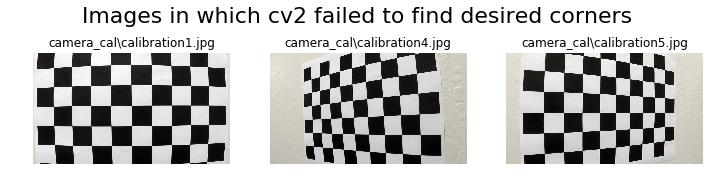

In [3]:
# Draw pictures
plt.figure(figsize=(12, 4))
plt.figtext(.5,.8,'Images in which cv2 failed to find desired corners', fontsize=22, ha='center')
for i, p in enumerate(corners_not_found):
    plt.subplot(1, 3, i+1)
    plt.imshow(mpimg.imread(p)) #draw the first image of each class
    plt.title(p)
    plt.axis('off')
plt.savefig("writeup_images/no_corners.png")
plt.show()


## Camera Calibration


In [4]:
#Load Pic to get an image size
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0]) #w,h

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

print ('Camera Calibration Matrix')
print (mtx)
print ('')
print ('Distortion Coefficients  Matrix')
print (dist)

def undistort(img):
    return cv2.undistort(img, mtx, dist, None, mtx)


Camera Calibration Matrix
[[  1.15777818e+03   0.00000000e+00   6.67113857e+02]
 [  0.00000000e+00   1.15282217e+03   3.86124583e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]

Distortion Coefficients  Matrix
[[-0.24688507 -0.02373156 -0.00109831  0.00035107 -0.00259866]]


## Test Calibration on images

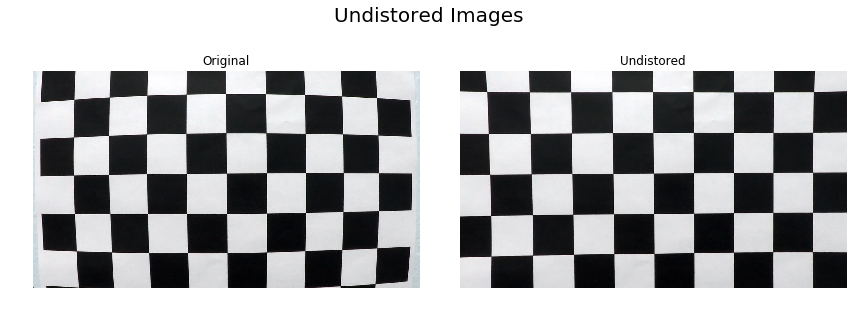

In [5]:

fig, ax = plt.subplots(1,2,figsize=(12, 5))
ax = ax.ravel()

ax[0].imshow(img)
ax[0].set_title('Original')
ax[0].axis('off')
ax[1].imshow(undistort(img))
ax[1].set_title('Undistored')
ax[1].axis('off')

fig.suptitle('Undistored Images', fontsize=20)
fig.savefig("writeup_images/undist_chess_img.png")

# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
#fig.subplots_adjust(top=0.5)


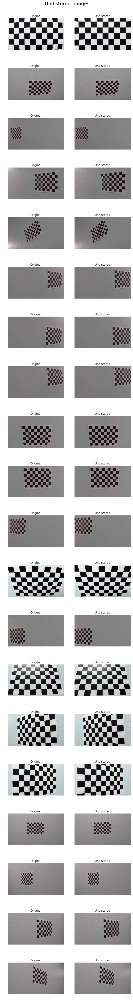

In [6]:
images = glob.glob('camera_cal/calibration*.jpg')

fig, ax = plt.subplots(int(len(images)),2, figsize=(8,int(3*len(images))))
ax = ax.ravel()
i = 0
for image_f_name in images:
    img = cv2.imread(image_f_name)
    
    if i+1<len(images)*2: #even is original
        ax[i].imshow(img,aspect='equal')
        ax[i].set_title('Original')
        ax[i].axis('off')
        ax[i+1].imshow(undistort(img),aspect='equal')
        ax[i+1].set_title('Undistored')
        ax[i+1].axis('off')
    i+=2   

fig.suptitle('Undistored Images', fontsize=20)
fig.savefig("writeup_images/undist__chess_img_all.png")

# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.97)

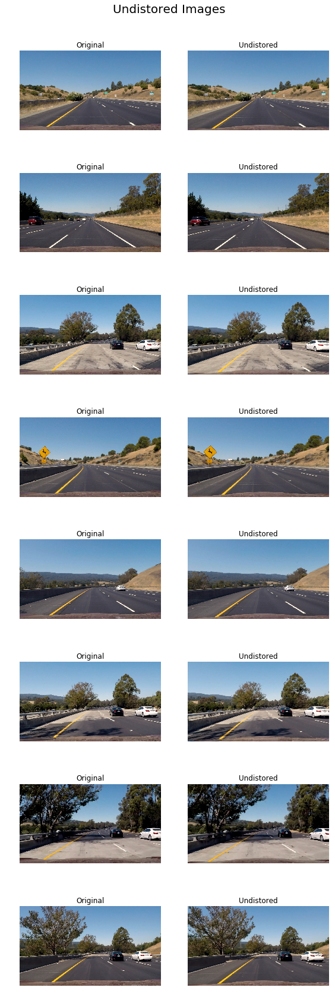

In [7]:
images = glob.glob('test_images/*.jpg')

fig, ax = plt.subplots(int(len(images)),2, figsize=(8,int(3*len(images))))
ax = ax.ravel()
i = 0
for image_f_name in images:
    img = cv2.imread(image_f_name)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    if i+1<len(images)*2: #even is original
        ax[i].imshow(img,aspect='equal')
        ax[i].set_title('Original')
        ax[i].axis('off')
        ax[i+1].imshow(undistort(img),aspect='equal')
        ax[i+1].set_title('Undistored')
        ax[i+1].axis('off')
    i+=2   


fig.suptitle('Undistored Images', fontsize=20)
fig.savefig("writeup_images/undist__test_img.png")

# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.95)

## Perspective Transform

Below we plot the perspective transform of each of the test images. We also show the source and destination points and how they were manipulated in order to get a top down view. 

The straight lines were used mostly in order to get a straight transform back to a top down view.

In [8]:
def unwarp(img, src, dst):
    
    h,w = img.shape[:2]
    
    # use cv2.getPerspectiveTransform() to get M, the transform matrix, and Minv, the inverse
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, (w,h), flags=cv2.INTER_LINEAR)
    return warped, M, Minv


def TopDownView (img):
    
        
    h,w = img.shape[:2]
    
    # define source and destination points for transform
    src = np.float32([(575,464),
                      (707,464), 
                      (258,682), 
                      (1049,682)])
    dst = np.float32([(450,0),
                      (w-450,0),
                      (450,h),
                      (w-450,h)])
    
    return unwarp(undistort(img), src, dst), src, dst
    

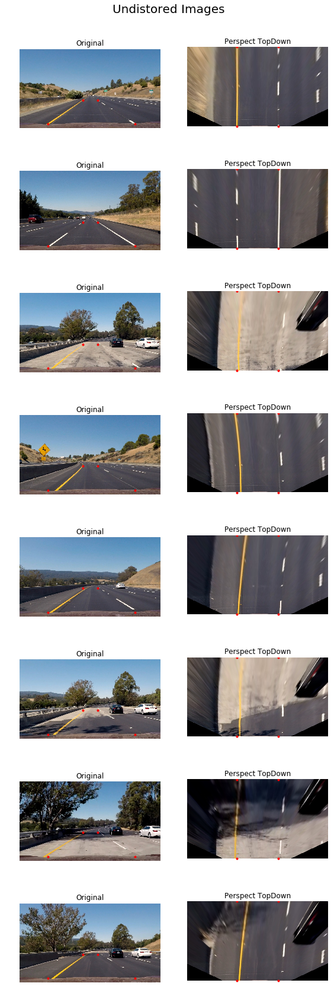

In [9]:
# define source and destination points for transform
images = glob.glob('test_images/*.jpg')

print()

fig, ax = plt.subplots(int(len(images)),2, figsize=(8,int(3*len(images))))
ax = ax.ravel()
i = 0
for image_f_name in images:
    if i+1<len(images)*2: #even is original
        img = cv2.imread(image_f_name)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        warp_img, src,dst = TopDownView(img)
    
        ax[i].imshow(img,aspect='equal')
        ax[i].set_title('Original')
        ax[i].axis('off')
        ax[i].plot(src[:,0],src[:,1],'.r')
        ax[i+1].imshow(warp_img[0],aspect='equal')
        ax[i+1].set_title('Perspect TopDown')
        ax[i+1].axis('off')
        ax[i+1].plot(dst[:,0],dst[:,1],'.r')
    i+=2   


fig.suptitle('Undistored Images', fontsize=20)
fig.savefig("writeup_images/undist__test_img.png")

# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.95)


## Colorspaces

In [10]:
def BGR2RGB(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def RGB2HSV(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

def RGB2HLS(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2HLS)

def RGB2LAB(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2Lab)

def plotRGB2AllColorspaces(img):
    fig, ax = plt.subplots(4,3, figsize=(12,int(2*len(images))))
    ax = ax.ravel()
    fig.subplots_adjust(hspace = .2, wspace=.01)
        
    ax[0].imshow(img[:,:,0], cmap='gray')
    ax[0].set_title('RGB R-channel', fontsize=15)
    ax[1].imshow(img[:,:,1], cmap='gray')
    ax[1].set_title('RGB G-Channel', fontsize=15)
    ax[2].imshow(img[:,:,2], cmap='gray')
    ax[2].set_title('RGB B-channel', fontsize=15)

    img = RGB2HSV(img)
    ax[3].imshow(img[:,:,0], cmap='gray')
    ax[3].set_title('HSV H-channel', fontsize=15)
    ax[4].imshow(img[:,:,1], cmap='gray')
    ax[4].set_title('HSV S-Channel', fontsize=15)
    ax[5].imshow(img[:,:,2], cmap='gray')
    ax[5].set_title('HSV V-channel', fontsize=15)
    
    img = RGB2HLS(img)
    ax[6].imshow(img[:,:,0], cmap='gray')
    ax[6].set_title('HSL H-channel', fontsize=15)
    ax[7].imshow(img[:,:,1], cmap='gray')
    ax[7].set_title('HSL L-Channel', fontsize=15)
    ax[8].imshow(img[:,:,2], cmap='gray')
    ax[8].set_title('HSL S-channel', fontsize=15)
    
    img = RGB2LAB(img)
    ax[9].imshow(img[:,:,0], cmap='gray')
    ax[9].set_title('LAB L-channel', fontsize=15)
    ax[10].imshow(img[:,:,1], cmap='gray')
    ax[10].set_title('LAB A-Channel', fontsize=15)
    ax[11].imshow(img[:,:,2], cmap='gray')
    ax[11].set_title('LAB B-channel', fontsize=15)    

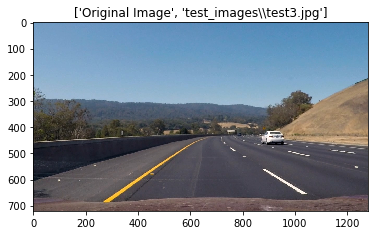

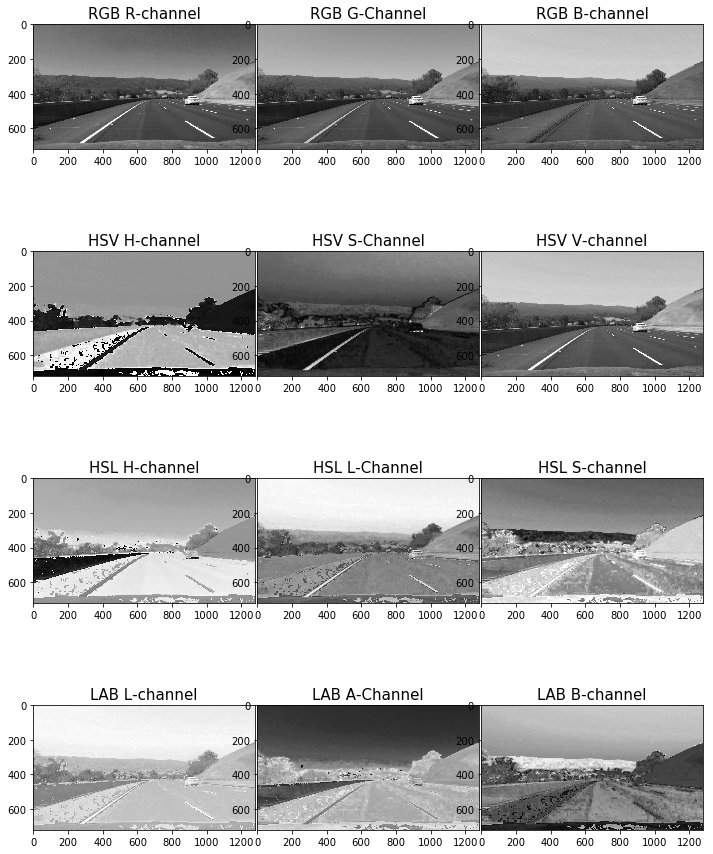

In [11]:
# pick random image
images = glob.glob('test_images/*.jpg')
from random import randint
index = randint(0, len(images)-1)

img = cv2.imread(images[index])
img = BGR2RGB(img)


fig = plt.figure()
plt.imshow(img)
plt.title(['Original Image', images[index]])

plotRGB2AllColorspaces(img)



## Sobel Operator

In [12]:

# Sobel
def sobel_img(img, thresh_min = 25, thresh_max = 255, sobel_kernel = 5):
    sobelx = np.absolute(cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    sobely = np.absolute(cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    scaled_sobelx = np.uint16(255*sobelx/np.max(sobelx))
    scaled_sobely = np.uint16(255*sobely/np.max(sobely))
    sobel_sum = scaled_sobelx+0.2*scaled_sobely
    scaled_sobel_sum = np.uint8(255*sobel_sum/np.max(sobel_sum))
    sum_binary = np.zeros_like(scaled_sobel_sum)
    sum_binary[(scaled_sobel_sum >= thresh_min) & (scaled_sobel_sum <= thresh_max)] = 1
    return sum_binary

# Solbel magnitude
def sobel_mag_img(img, thresh_min = 25, thresh_max = 255, sobel_kernel = 11):
    sobelx = np.absolute(cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    sobely = np.absolute(cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    scaled_gradmag = np.uint8(255*gradmag/np.max(gradmag))
    gradmag_binary = np.zeros_like(scaled_gradmag)
    gradmag_binary[(scaled_gradmag >= thresh_min) & (scaled_gradmag <= thresh_max)] = 1
    return gradmag_binary

# Sobel direction
def sobel_dir_img(img, thresh_min = 0.0, thresh_max = 1.5, sobel_kernel = 11):
    sobelx = np.absolute(cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    sobely = np.absolute(cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    graddir = np.arctan2(sobely, sobelx)
    graddir_binary =  np.zeros_like(graddir)
    graddir_binary[(graddir >= thresh_min) & (graddir <= thresh_max)] = 1
    return  graddir_binary


Widget Javascript not detected.  It may not be installed or enabled properly.


<function __main__.update>

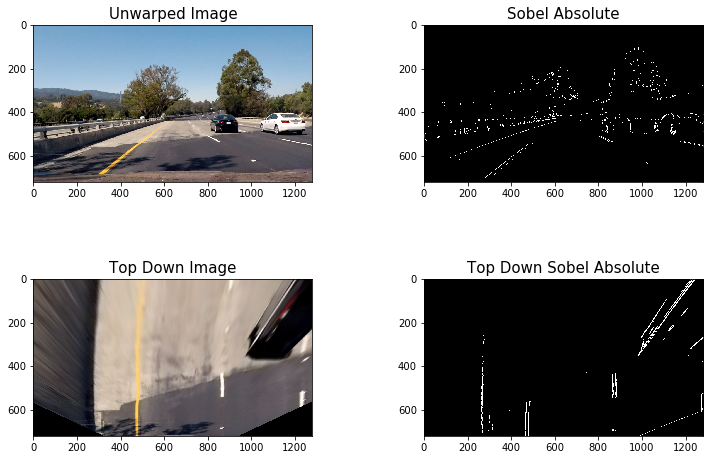

In [13]:
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

# pick random image
images = glob.glob('test_images/*.jpg')
from random import randint
index = randint(0, len(images)-1)

img = cv2.imread(images[index])
img = BGR2RGB(img)
img_gray = (cv2.cvtColor(img, cv2.COLOR_RGB2GRAY))

warp_img, src,dst = TopDownView(img)
warp_img_gray = (cv2.cvtColor(warp_img[0], cv2.COLOR_RGB2GRAY))

def update(min_thresh, max_thresh):
    img_sobel = sobel_img(undistort(img_gray), min_thresh, max_thresh)
 
    fig, ax = plt.subplots(2,2, figsize=(12,int(4*2)))
    ax = ax.ravel()
    fig.subplots_adjust(hspace = .4, wspace=.4)
    ax[0].imshow(img)
    ax[0].set_title('Unwarped Image', fontsize=15)
    ax[1].imshow(img_sobel, cmap='gray')
    ax[1].set_title('Sobel Absolute', fontsize=15)
    

    warp_img_sobel = sobel_img(undistort(warp_img_gray), min_thresh, max_thresh)
    ax[2].imshow(warp_img[0])
    ax[2].set_title('Top Down Image', fontsize=15)
    ax[3].imshow(warp_img_sobel, cmap='gray')
    ax[3].set_title('Top Down Sobel Absolute', fontsize=15)

interact(update, 
         min_thresh=widgets.IntSlider(min=0,max=255,step=1,value=62), 
         max_thresh=widgets.IntSlider(min=0,max=255,step=1,value=183))



Widget Javascript not detected.  It may not be installed or enabled properly.


<function __main__.update>

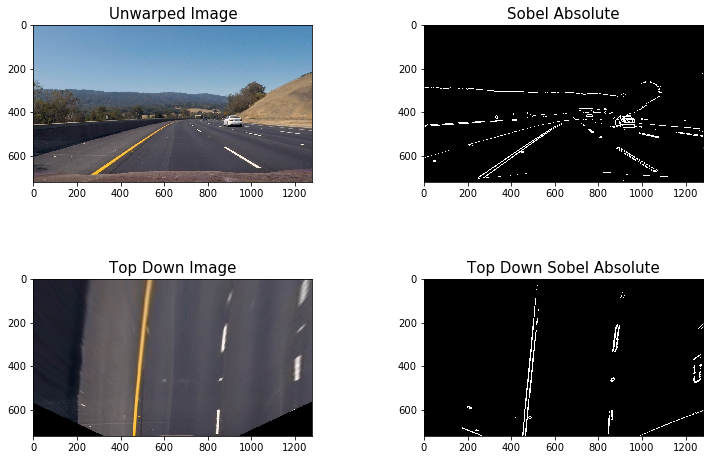

In [14]:
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

# pick random image
images = glob.glob('test_images/*.jpg')
from random import randint
index = randint(0, len(images)-1)

img = cv2.imread(images[index])
img = BGR2RGB(img)
img_gray = (cv2.cvtColor(img, cv2.COLOR_RGB2GRAY))

warp_img, src,dst = TopDownView(img)
warp_img_gray = (cv2.cvtColor(warp_img[0], cv2.COLOR_RGB2GRAY))

def update(min_thresh, max_thresh):
    img_sobel = sobel_mag_img(undistort(img_gray), min_thresh, max_thresh)
 
    fig, ax = plt.subplots(2,2, figsize=(12,int(4*2)))
    ax = ax.ravel()
    fig.subplots_adjust(hspace = .4, wspace=.4)
    ax[0].imshow(img)
    ax[0].set_title('Unwarped Image', fontsize=15)
    ax[1].imshow(img_sobel, cmap='gray')
    ax[1].set_title('Sobel Absolute', fontsize=15)
    

    warp_img_sobel = sobel_mag_img(undistort(warp_img_gray), min_thresh, max_thresh)
    ax[2].imshow(warp_img[0])
    ax[2].set_title('Top Down Image', fontsize=15)
    ax[3].imshow(warp_img_sobel, cmap='gray')
    ax[3].set_title('Top Down Sobel Absolute', fontsize=15)

interact(update, 
         min_thresh=widgets.IntSlider(min=0,max=255,step=1,value=62), 
         max_thresh=widgets.IntSlider(min=0,max=255,step=1,value=183))



Widget Javascript not detected.  It may not be installed or enabled properly.


<function __main__.update>

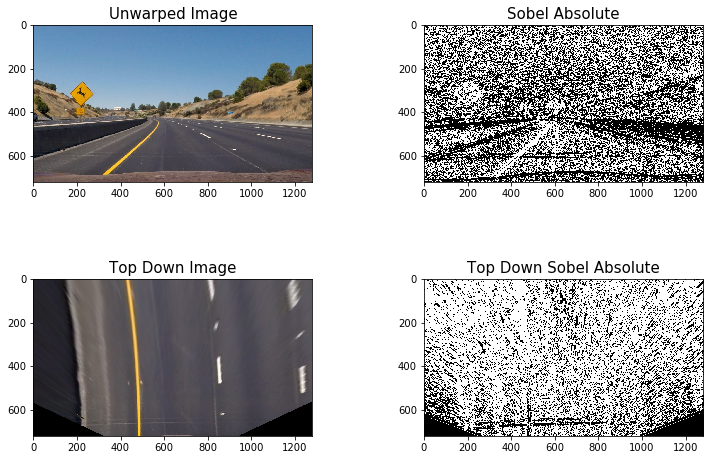

In [15]:
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

# pick random image
images = glob.glob('test_images/*.jpg')
from random import randint
index = randint(0, len(images)-1)

img = cv2.imread(images[index])
img = BGR2RGB(img)
img_gray = (cv2.cvtColor(img, cv2.COLOR_RGB2GRAY))

warp_img, src,dst = TopDownView(img)
warp_img_gray = (cv2.cvtColor(warp_img[0], cv2.COLOR_RGB2GRAY))

def update(min_thresh, max_thresh):
    img_sobel = sobel_dir_img(undistort(img_gray), min_thresh, max_thresh)
 
    fig, ax = plt.subplots(2,2, figsize=(12,int(4*2)))
    ax = ax.ravel()
    fig.subplots_adjust(hspace = .4, wspace=.4)
    ax[0].imshow(img)
    ax[0].set_title('Unwarped Image', fontsize=15)
    ax[1].imshow(img_sobel, cmap='gray')
    ax[1].set_title('Sobel Absolute', fontsize=15)
    

    warp_img_sobel = sobel_dir_img(undistort(warp_img_gray), min_thresh, max_thresh)
    ax[2].imshow(warp_img[0])
    ax[2].set_title('Top Down Image', fontsize=15)
    ax[3].imshow(warp_img_sobel, cmap='gray')
    ax[3].set_title('Top Down Sobel Absolute', fontsize=15)

interact(update, 
         min_thresh=widgets.FloatSlider(min=0,max=np.pi/2,step=0.01,value=0.040), 
         max_thresh=widgets.FloatSlider(min=0,max=np.pi/2,step=0.01,value=1.05))



In [16]:

# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=25, mag_thresh=(25, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # 3) Calculate the magnitude 
    mag_sobel = np.sqrt(np.square(sobelx) + np.square(sobely))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*mag_sobel/np.max(mag_sobel))
    # 5) Create a binary mask where mag thresholds are met
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    binary_output = np.copy(sxbinary) 
    return binary_output

Widget Javascript not detected.  It may not be installed or enabled properly.


<function __main__.update>

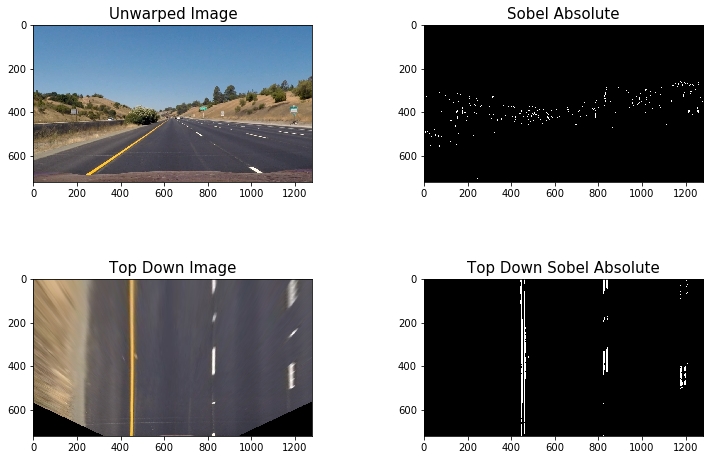

In [17]:
# pick random image
images = glob.glob('test_images/*.jpg')
from random import randint
index = randint(0, len(images)-1)

img = cv2.imread(images[index])
img = BGR2RGB(img)
img_gray = (cv2.cvtColor(img, cv2.COLOR_RGB2GRAY))

warp_img, src,dst = TopDownView(img)
warp_img_gray = (cv2.cvtColor(warp_img[0], cv2.COLOR_RGB2GRAY))

def update(mag_kernel_size, mag_min_thresh, mag_max_thresh, dir_kernel_size, dir_min_thresh, dir_max_thresh):
    exampleImg_sobelMag2 = sobel_mag_img(undistort(img_gray), mag_min_thresh, mag_max_thresh, mag_kernel_size)
    exampleImg_sobelDir2 = sobel_dir_img(undistort(img_gray), dir_min_thresh, dir_max_thresh, dir_kernel_size)
    combined = np.zeros_like(exampleImg_sobelMag2)
    combined[((exampleImg_sobelMag2 == 1) & (exampleImg_sobelDir2 == 1))] = 1

    fig, ax = plt.subplots(2,2, figsize=(12,int(4*2)))
    ax = ax.ravel()
    fig.subplots_adjust(hspace = .4, wspace=.4)
    ax[0].imshow(img)
    ax[0].set_title('Unwarped Image', fontsize=15)
    ax[1].imshow(combined, cmap='gray')
    ax[1].set_title('Sobel Absolute', fontsize=15)
    

    exampleImg_sobelMag2 = sobel_mag_img(warp_img_gray, mag_min_thresh, mag_max_thresh, mag_kernel_size)
    exampleImg_sobelDir2 = sobel_dir_img(warp_img_gray, dir_min_thresh, dir_max_thresh, dir_kernel_size)
    combined = np.zeros_like(exampleImg_sobelMag2)
    combined[((exampleImg_sobelMag2 == 1) & (exampleImg_sobelDir2 == 1))] = 1
    ax[2].imshow(warp_img[0])
    ax[2].set_title('Top Down Image', fontsize=15)
    ax[3].imshow(combined, cmap='gray')
    ax[3].set_title('Top Down Sobel Absolute', fontsize=15)

    
interact(update, mag_kernel_size=widgets.IntSlider(min=1,max=31,step=1,value=5,continuous_update=False) , 
                 mag_min_thresh=widgets.IntSlider(min=0,max=255,step=1,value=30,continuous_update=False), 
                 mag_max_thresh=widgets.IntSlider(min=0,max=255,step=1,value=141,continuous_update=False), 
                 dir_kernel_size=widgets.IntSlider(min=1,max=31,step=1,value=5,continuous_update=False) , 
                 dir_min_thresh=widgets.FloatSlider(min=-np.pi/2,max=np.pi/2,step=0.01,value=-1.08,continuous_update=False),
                 dir_max_thresh=widgets.FloatSlider(min=-np.pi/2,max=np.pi/2,step=0.01,value=0.28),continuous_update=False)



## Thresholded Binaries

Widget Javascript not detected.  It may not be installed or enabled properly.


<function __main__.update>

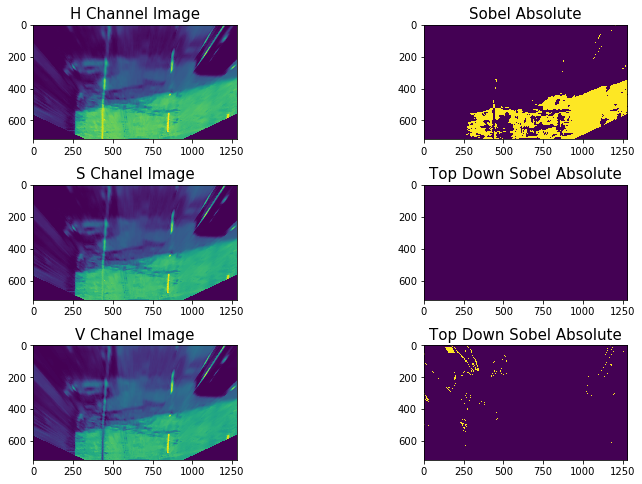

In [18]:
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
%matplotlib inline
# pick random image
images = glob.glob('test_images/test5.jpg')
from random import randint
index = randint(0, len(images)-1)

img = cv2.imread(images[index])
img = BGR2RGB(img)
#img = RGB2HSV(img)
img_gray = (cv2.cvtColor(img, cv2.COLOR_RGB2GRAY))

warp_img, src,dst = TopDownView(img)
warp_img_gray = (cv2.cvtColor(warp_img[0], cv2.COLOR_RGB2GRAY))

def update(H_Low,H_High,S_Low,S_High,V_Low,V_High):
    img_sobel = cv2.inRange(undistort(img), np.array([H_Low,S_Low,V_Low]), np.array([H_High,S_High,V_High]))
    fig, ax = plt.subplots(3,2, figsize=(12,int(4*2)))
    ax = ax.ravel()
    fig.subplots_adjust(hspace = .4, wspace=.4)
    ax[0].imshow(img[:,:,0])
    ax[0].set_title('H Channel Image', fontsize=15)
    ax[1].imshow(img_sobel, cmap='gray')
    ax[1].set_title('Sobel Absolute', fontsize=15)
    

    warp_img_sobel = cv2.inRange(warp_img[0], np.array([H_Low,S_Low,V_Low]), np.array([H_High,S_High,V_High]))
    ax[2].imshow(img[:,:,1])
    ax[2].set_title('S Chanel Image', fontsize=15)
    ax[3].imshow(warp_img_sobel, cmap='gray')
    ax[3].set_title('Top Down Sobel Absolute', fontsize=15)

    ax[4].imshow(img[:,:,2])
    ax[4].set_title('V Chanel Image', fontsize=15)
    
    warp_img_sobel = cv2.inRange(warp_img[0][:,:,1], np.array([H_Low]), np.array([H_High]))
    ax[0].imshow(warp_img[0][:,:,0])
    ax[0].set_title('H Channel Image', fontsize=15)
    ax[1].imshow(warp_img_sobel)
    ax[1].set_title('Sobel Absolute', fontsize=15)
    

    warp_img_sobel = cv2.inRange(warp_img[0][:,:,1], np.array([S_Low]), np.array([S_High]))
    ax[2].imshow(warp_img[0][:,:,1])
    ax[2].set_title('S Chanel Image', fontsize=15)
    ax[3].imshow(warp_img_sobel)
    ax[3].set_title('Top Down Sobel Absolute', fontsize=15)
    
    warp_img_sobel = cv2.inRange(warp_img[0][:,:,2], np.array([V_Low]), np.array([V_High]))
    ax[4].imshow(warp_img[0][:,:,2])
    ax[4].set_title('V Chanel Image', fontsize=15)
    ax[5].imshow(warp_img_sobel)
    ax[5].set_title('Top Down Sobel Absolute', fontsize=15)
interact(update, H_Low=widgets.IntSlider(min=0,max=180,step=1,value=150,continuous_update=False), 
                 H_High=widgets.IntSlider(min=0,max=180,step=1,value=173,continuous_update=False), 
                 S_Low=widgets.IntSlider(min=0,max=255,step=1,value=141,continuous_update=False), 
                 S_High=widgets.IntSlider(min=0,max=255,step=1,value=5,continuous_update=False) , 
                 V_Low=widgets.IntSlider(min=0,max=255,step=1,value=5,continuous_update=False) , 
             V_High=widgets.IntSlider(min=0,max=255,step=1,value=5,continuous_update=False)) 

Widget Javascript not detected.  It may not be installed or enabled properly.


<function __main__.update>

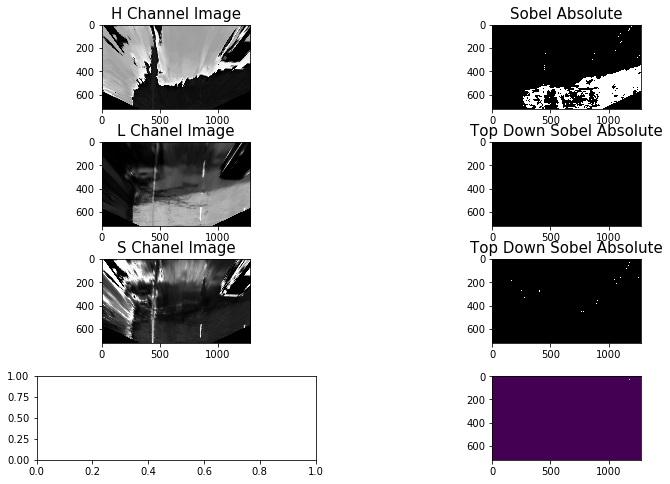

In [19]:

from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
%matplotlib inline
# pick random image
images = glob.glob('test_images/test5.jpg')
from random import randint
index = randint(0, len(images)-1)



img = cv2.imread(images[index])
img = BGR2RGB(img)
img = RGB2HLS(img)
img_gray = (cv2.cvtColor(img, cv2.COLOR_RGB2GRAY))

warp_img, src,dst = TopDownView(img)
warp_img_gray = (cv2.cvtColor(warp_img[0], cv2.COLOR_RGB2GRAY))



def update(H_Low,H_High,L_Low,L_High,S_Low,S_High):
    img_sobel = cv2.inRange(undistort(img), np.array([H_Low,L_Low,S_Low]), np.array([H_High,L_High,S_High]))
    fig, ax = plt.subplots(4,2, figsize=(12,int(4*2)))
    ax = ax.ravel()
    fig.subplots_adjust(hspace = .4, wspace=.4)
    ax[0].imshow(img[:,:,0])
    ax[0].set_title('H Channel Image', fontsize=15)
    ax[1].imshow(img_sobel, cmap='gray')
    ax[1].set_title('Sobel Absolute', fontsize=15)
    

    warp_img_sobel = cv2.inRange(warp_img[0], np.array([H_Low,L_Low,S_Low]), np.array([H_High,L_High,S_High]))
    ax[2].imshow(img[:,:,1], cmap='gray')
    ax[2].set_title('S Chanel Image', fontsize=15)
    ax[3].imshow(warp_img_sobel, cmap='gray')
    ax[3].set_title('Top Down Sobel Absolute', fontsize=15)

    ax[4].imshow(img[:,:,2], cmap='gray')
    ax[4].set_title('V Chanel Image', fontsize=15)
    
    warp_img_sobel_H = cv2.inRange(warp_img[0][:,:,1], np.array([H_Low]), np.array([H_High]))
    ax[0].imshow(warp_img[0][:,:,0], cmap='gray')
    ax[0].set_title('H Channel Image', fontsize=15)
    ax[1].imshow(warp_img_sobel_H, cmap='gray')
    ax[1].set_title('Sobel Absolute', fontsize=15)
    

    warp_img_sobel_L = cv2.inRange(warp_img[0][:,:,1], np.array([L_Low]), np.array([L_High]))
    ax[2].imshow(warp_img[0][:,:,1], cmap='gray')
    ax[2].set_title('L Chanel Image', fontsize=15)
    ax[3].imshow(warp_img_sobel_L , cmap='gray')
    ax[3].set_title('Top Down Sobel Absolute', fontsize=15)
    
    warp_img_sobel_S = cv2.inRange(warp_img[0][:,:,2], np.array([S_Low]), np.array([S_High]))
    ax[4].imshow(warp_img[0][:,:,2], cmap='gray')
    ax[4].set_title('S Chanel Image', fontsize=15)
    ax[5].imshow(warp_img_sobel_S, cmap='gray')
    print(warp_img_sobel.shape)
    ax[5].set_title('Top Down Sobel Absolute', fontsize=15)
    
    ax[7].imshow(cv2.bitwise_and(warp_img_sobel_H,warp_img_sobel_S,warp_img_sobel_L))
interact(update, H_Low=widgets.IntSlider(min=0,max=180,step=1,value=150,continuous_update=False), 
                 H_High=widgets.IntSlider(min=0,max=180,step=1,value=173,continuous_update=False), 
                 L_Low=widgets.IntSlider(min=0,max=255,step=1,value=141,continuous_update=False), 
                 L_High=widgets.IntSlider(min=0,max=255,step=1,value=5,continuous_update=False) , 
                 S_Low=widgets.IntSlider(min=0,max=255,step=1,value=5,continuous_update=False) , 
                 S_High=widgets.IntSlider(min=0,max=255,step=1,value=5,continuous_update=False)) 

In [20]:
## PipeLine Tuning

Widget Javascript not detected.  It may not be installed or enabled properly.


<function __main__.update>

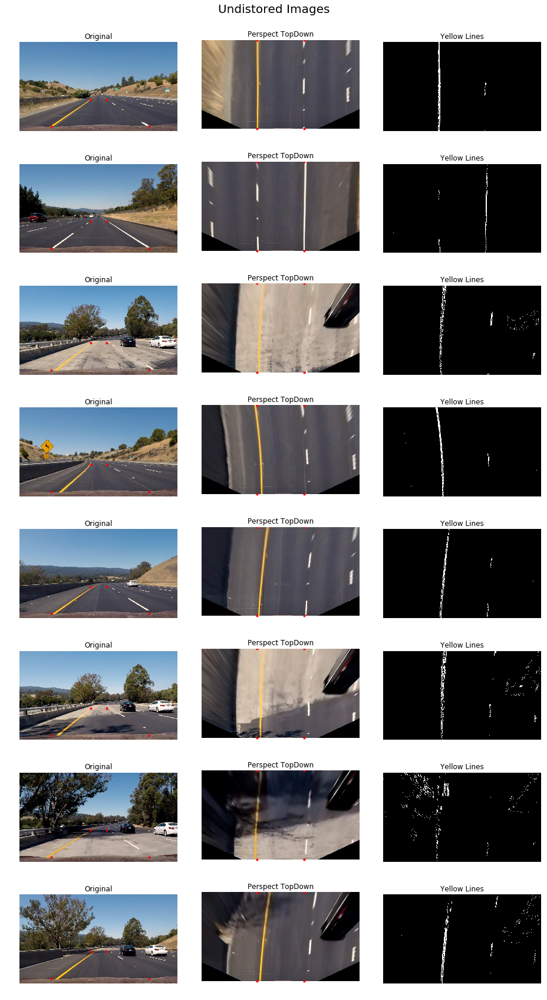

In [21]:
def yellow_lines_tunning(BRG_img,mag_kernel_size, mag_min_thresh, mag_max_thresh, dir_kernel_size, dir_min_thresh, dir_max_thresh, R_Low, R_High, S_Low, S_High,H_Low,H_High, L_Low, L_High):
    img_RGB = BGR2RGB(BRG_img)
    img = RGB2HLS(img_RGB)
    img_gray = (cv2.cvtColor(img, cv2.COLOR_RGB2GRAY))
    
    

    warp_img, src,dst = TopDownView(img)
    warp_img_gray = (cv2.cvtColor(warp_img[0], cv2.COLOR_RGB2GRAY))
    
    rgb_thres = cv2.inRange(warp_img[0][:,:,0], np.array([R_Low]), np.array([R_High]))
    hls_tresh = cv2.inRange(warp_img[0][:,:,2], np.array([S_Low]), np.array([S_High]))
    h_tresh = cv2.inRange(warp_img[0][:,:,0], np.array([H_Low]), np.array([H_High]))
    l_tresh = cv2.inRange(warp_img[0][:,:,1], np.array([L_Low]), np.array([L_High]))
    
    exampleImg_sobelMag2 = sobel_mag_img(warp_img_gray, mag_min_thresh, mag_max_thresh, 5)
    exampleImg_sobelDir2 = sobel_dir_img(warp_img_gray, dir_min_thresh, dir_max_thresh, 5)
    combined = np.zeros_like(exampleImg_sobelMag2)
    combined[((exampleImg_sobelMag2 == 1) & (exampleImg_sobelDir2 == 1))] = 1
    
    return cv2.bitwise_and(cv2.bitwise_and(hls_tresh,h_tresh,l_tresh,rgb_thres),combined)
  
# define source and destination points for transform
images = glob.glob('test_images/*.jpg')    
    
    
def update(mag_kernel_size, mag_min_thresh, mag_max_thresh, dir_kernel_size, dir_min_thresh, dir_max_thresh,R_Low, R_High, S_Low, S_High, H_Low, H_High,L_Low, L_High):
    fig, ax = plt.subplots(int(len(images)),3, figsize=(13,int(3*len(images))))
    ax = ax.ravel()
    i = 0
    for image_f_name in images:
        if i+1<len(images)*3: #even is original
            img = cv2.imread(image_f_name)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            warp_img, src,dst = TopDownView(img)
            yellow = yellow_lines_tunning(img,mag_kernel_size, mag_min_thresh, mag_max_thresh, dir_kernel_size, dir_min_thresh, dir_max_thresh,R_Low, R_High, S_Low, S_High, H_Low, H_High,L_Low, L_High)
            
            
            

            ax[i].imshow(img,aspect='equal')
            ax[i].set_title('Original')
            ax[i].axis('off')
            ax[i].plot(src[:,0],src[:,1],'.r')
            ax[i+1].imshow(warp_img[0],aspect='equal')
            ax[i+1].set_title('Perspect TopDown')
            ax[i+1].axis('off')
            ax[i+1].plot(dst[:,0],dst[:,1],'.r')
            ax[i+2].imshow(yellow, aspect='equal', cmap='gray')
            ax[i+2].set_title('Yellow Lines')
            ax[i+2].axis('off')

        i+=3   


    fig.suptitle('Undistored Images', fontsize=20)
    fig.savefig("writeup_images/undist__test_img.png")

    # Tight layout often produces nice results
    # but requires the title to be spaced accordingly
    fig.tight_layout()
    fig.subplots_adjust(top=0.95)


    
interact(update, R_Low=widgets.IntSlider(min=0,max=255,step=1,value=42,continuous_update=False), 
                 R_High=widgets.IntSlider(min=0,max=255,step=1,value=247,continuous_update=False), 
                 H_Low=widgets.IntSlider(min=0,max=255,step=1,value=26,continuous_update=False), 
                 H_High=widgets.IntSlider(min=0,max=255,step=1,value=182,continuous_update=False) , 
                 S_Low=widgets.IntSlider(min=0,max=255,step=1,value=126,continuous_update=False) , 
                 S_High=widgets.IntSlider(min=0,max=255,step=1,value=255,continuous_update=False),
                 L_Low=widgets.IntSlider(min=0,max=255,step=1,value=122,continuous_update=False) , 
                 L_High=widgets.IntSlider(min=0,max=255,step=1,value=255,continuous_update=False),         
                 mag_kernel_size=widgets.IntSlider(min=1,max=31,step=1,value=5,continuous_update=False) , 
                 mag_min_thresh=widgets.IntSlider(min=0,max=255,step=1,value=0,continuous_update=False), 
                 mag_max_thresh=widgets.IntSlider(min=0,max=255,step=1,value=141,continuous_update=False), 
                 dir_kernel_size=widgets.IntSlider(min=1,max=31,step=1,value=5,continuous_update=False) , 
                 dir_min_thresh=widgets.FloatSlider(min=-np.pi/2,max=np.pi/2,step=0.01,value=-1.33,continuous_update=False),
                 dir_max_thresh=widgets.FloatSlider(min=-np.pi/2,max=np.pi/2,step=0.01,value=0.28,continuous_update=False)) 
    
    

In [22]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


def pipeline(BRG_img):
    laneLine = yellow_lines_tunning(BRG_img,5, 0, 194, 5, -1.33, 0.28, 20, 255, 126, 255,26,182, 122, 255)
    
    # This time we are defining a four sided polygon to mask
    imshape = laneLine.shape
    vertices = np.array([[(300,imshape[0]),(300, 0), (1000, 0), (imshape[0],1000)]], dtype=np.int32)
    masked_edges = region_of_interest(laneLine, vertices)
    return masked_edges

    

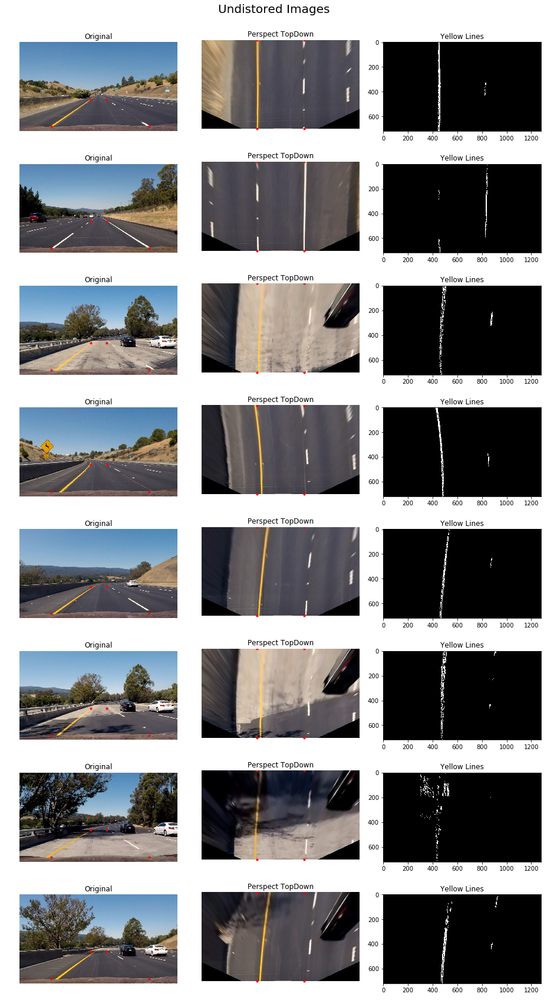

In [23]:
# define source and destination points for transform
images = glob.glob('test_images/*.jpg') 

fig, ax = plt.subplots(int(len(images)),3, figsize=(13,int(3*len(images))))
ax = ax.ravel()
i = 0
MinV = 0;
for image_f_name in images:
    if i+1<len(images)*3: #even is original
        img = cv2.imread(image_f_name)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        warp_img, src,dst = TopDownView(img)
        MinV = warp_img[2]
        yellow = pipeline(img)



        ax[i].imshow(img,aspect='equal')
        ax[i].set_title('Original')
        ax[i].axis('off')
        ax[i].plot(src[:,0],src[:,1],'.r')
        ax[i+1].imshow(warp_img[0],aspect='equal')
        ax[i+1].set_title('Perspect TopDown')
        ax[i+1].axis('off')
        ax[i+1].plot(dst[:,0],dst[:,1],'.r')
        ax[i+2].imshow(yellow, aspect='equal', cmap='gray')
        ax[i+2].set_title('Yellow Lines')
        ax[i+2].axis('on')

    i+=3   


fig.suptitle('Undistored Images', fontsize=20)
fig.savefig("writeup_images/undist__test_img.png")

# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.95)

## NEW Pipeline based on updates from Mentor
** Comments from mentor **

If you want to continue to explore additional color channels, I have seen that the L channel from LUV with lower and upper thresholds around 225 & 255 respectively works very well to pick out the white lines, even in the parts of the video with heavy shadows and brighter pavement. You can also try out the b channel from Lab which does a great job with the yellow lines (you can play around with thresholds around 155 & 200).


In [24]:
# Define a function that thresholds the L-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_lthresh(img, thresh=(225, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    hls_l = hls[:,:,1] #H=0, L=1, 
    hls_l = hls_l*(255/np.max(hls_l))
    # 2) Apply a threshold to the L channel
    binary_output = np.zeros_like(hls_l)
    binary_output[(hls_l > thresh[0]) & (hls_l <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary_output





# Define a function that thresholds the B-channel of LAB
# Use exclusive lower bound (>) and inclusive upper (<=), OR the results of the thresholds (B channel should capture
# yellows)
def lab_bthresh(img, thresh=(190,255)):
    # 1) Convert to LAB color space
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    lab_b = lab[:,:,2]
    # don't normalize if there are no yellows in the image
    if np.max(lab_b) > 175:
        lab_b = lab_b*(255/np.max(lab_b))
    # 2) Apply a threshold to the L channel
    binary_output = np.zeros_like(lab_b)
    binary_output[((lab_b > thresh[0]) & (lab_b <= thresh[1]))] = 1
    # 3) Return a binary image of threshold result
    return binary_output

# Define the complete image processing pipeline, reads raw image and returns binary image with lane lines identified
# (hopefully)
def pipelineA(img):
    # Undistort
    img_undistort = undistort(img)
    img = BGR2RGB(img_undistort)
    # Perspective Transform
    warp_img, src,dst = TopDownView(img)

    # HLS L-channel Threshold (using default parameters)
    img_LThresh = hls_lthresh(warp_img[0])

    # Lab B-channel Threshold (using default parameters)
    img_BThresh = lab_bthresh(warp_img[0])
    
    # Combine HLS and Lab B channel thresholds
    combined = np.zeros_like(img_BThresh)
    combined[(img_LThresh == 1) | (img_BThresh == 1)] = 1
    return combined


def pipeline(img, RGB=False):
    img_undistort = undistort(img)
    if not RGB:
        img_undistort = BGR2RGB(img_undistort)
    
    warp_img_RGB, src,dst = TopDownView(img_undistort)
    
    warp_img_HLS = RGB2HLS(warp_img_RGB[0])
    norm_img_HLS =  np.zeros_like(warp_img_HLS)
    norm_img_LAB =  np.zeros_like(warp_img_HLS)
    norm_img_HLS = cv2.normalize(warp_img_HLS,norm_img_HLS, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
    
    
    warp_img_LAB = RGB2LAB(warp_img_RGB[0])
    norm_img_LAB = cv2.normalize(warp_img_LAB,norm_img_LAB, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
    
    L_Low = 200
    L_High = 255
    B_Low = 155
    B_High = 255
    
    l_tresh = cv2.inRange(norm_img_HLS[:,:,1], np.array([L_Low]), np.array([L_High]))
    b_tresh = cv2.inRange(norm_img_LAB[:,:,2], np.array([B_Low]), np.array([B_High]))
    

    laneLine = cv2.bitwise_or(b_tresh,l_tresh)
    
    # This time we are defining a four sided polygon to mask
    imshape = laneLine.shape
    vertices = np.array([[(300,imshape[0]),(300, 0), (1000, 0), (imshape[0],1000)]], dtype=np.int32)
    masked_edges = region_of_interest(laneLine, vertices)
    return masked_edges

In [25]:
# Define the complete image processing pipeline, reads raw image and returns binary image with lane lines identified
# (hopefully)
def pipelineA(img):
    # Undistort
    #img_RGB = BGR2RGB(img)
    img_undistort = undistort(img)
    
    # Perspective Transform
    img_unwarp, M, Minv = unwarp(img_undistort, src, dst)

    # Sobel Absolute (using default parameters)
    #img_sobelAbs = abs_sobel_thresh(img_unwarp)

    # Sobel Magnitude (using default parameters)
    #img_sobelMag = mag_thresh(img_unwarp)
    
    # Sobel Direction (using default parameters)
    #img_sobelDir = dir_thresh(img_unwarp)
    
    # HLS S-channel Threshold (using default parameters)
    #img_SThresh = hls_sthresh(img_unwarp)

    # HLS L-channel Threshold (using default parameters)
    img_LThresh = hls_lthresh(img_unwarp)

    # Lab B-channel Threshold (using default parameters)
    img_BThresh = lab_bthresh(img_unwarp)
    
    # Combine HLS and Lab B channel thresholds
    combined = np.zeros_like(img_BThresh)
    combined[(img_LThresh == 1) | (img_BThresh == 1)] = 1
    return combined
    
print('...')

...


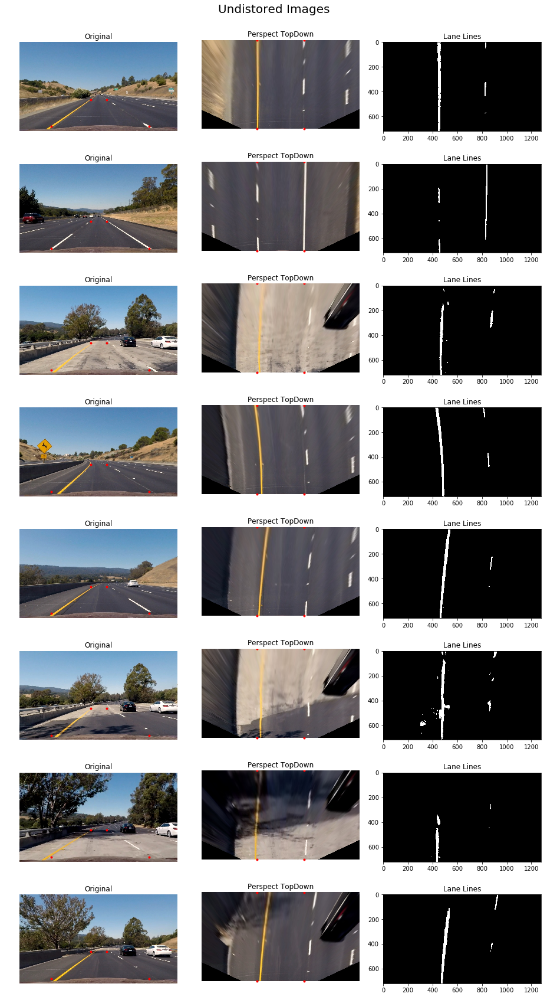

In [26]:
# define source and destination points for transform
images = glob.glob('test_images/*.jpg') 

fig, ax = plt.subplots(int(len(images)),3, figsize=(13,int(3*len(images))))
ax = ax.ravel()
i = 0
MinV = 0;
for image_f_name in images:
    if i+1<len(images)*3: #even is original
        img = cv2.imread(image_f_name)
        img_undistort = undistort(img)
        img_RGB = BGR2RGB(img_undistort)
        warp_img, src,dst = TopDownView(img_RGB)
        MinV = warp_img[2]
        yellow = pipeline(img)



        ax[i].imshow(img_RGB,aspect='equal')
        ax[i].set_title('Original')
        ax[i].axis('off')
        ax[i].plot(src[:,0],src[:,1],'.r')
        ax[i+1].imshow(warp_img[0],aspect='equal')
        ax[i+1].set_title('Perspect TopDown')
        ax[i+1].axis('off')
        ax[i+1].plot(dst[:,0],dst[:,1],'.r')
        ax[i+2].imshow(yellow, aspect='equal', cmap='gray')
        ax[i+2].set_title('Lane Lines')
        ax[i+2].axis('on')

    i+=3   


fig.suptitle('Undistored Images', fontsize=20)
fig.savefig("writeup_images/undist__test_img.png")

# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.95)

## Sliding Window

In [27]:
# Define method to fit polynomial to binary image with lines extracted, using sliding window
def sliding_window_polyfit(img):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    quarter_point = np.int(midpoint//2)
    # Previously the left/right base was the max of the left/right half of the histogram
    # this changes it so that only a quarter of the histogram (directly to the left/right) is considered
    leftx_base = np.argmax(histogram[quarter_point:midpoint]) + quarter_point
    rightx_base = np.argmax(histogram[midpoint:(midpoint+quarter_point)]) + midpoint
    
    #print('base pts:', leftx_base, rightx_base)

    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 40
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # Rectangle data for visualization
    rectangle_data = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        rectangle_data.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    left_fit, right_fit = (None, None)
    # Fit a second order polynomial to each
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    visualization_data = (rectangle_data, histogram)
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data

(720, 0)

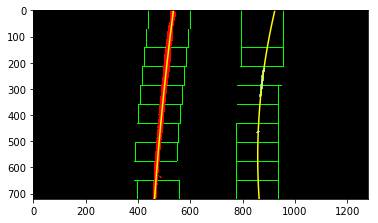

In [28]:
#visualize the result on example image
exampleImg = cv2.imread('./test_images/test3.jpg')
exampleImg_bin = pipeline(exampleImg)
    
left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = sliding_window_polyfit(exampleImg_bin)

h = exampleImg.shape[0]
left_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
right_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
#print('fit x-intercepts:', left_fit_x_int, right_fit_x_int)

rectangles = visualization_data[0]
histogram = visualization_data[1]

# Create an output image to draw on and  visualize the result
out_img = np.uint8(np.dstack((exampleImg_bin, exampleImg_bin, exampleImg_bin))*255)
# Generate x and y values for plotting
ploty = np.linspace(0, exampleImg_bin.shape[0]-1, exampleImg_bin.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
for rect in rectangles:
# Draw the windows on the visualization image
    cv2.rectangle(out_img,(rect[2],rect[0]),(rect[3],rect[1]),(0,255,0), 2) 
    cv2.rectangle(out_img,(rect[4],rect[0]),(rect[5],rect[1]),(0,255,0), 2) 
# Identify the x and y positions of all nonzero pixels in the image
nonzero = exampleImg_bin.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [100, 200, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)



(0, 1280)

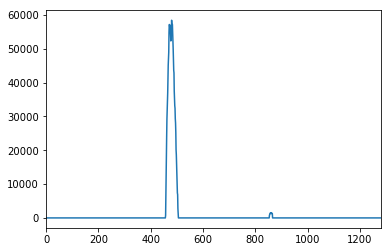

In [29]:

# Print histogram from sliding window polyfit for example image
plt.plot(histogram)
plt.xlim(0, 1280)


In [30]:
# Define method to fit polynomial to binary image based upon a previous fit (chronologically speaking);
# this assumes that the fit will not change significantly from one video frame to the next
def polyfit_using_prev_fit(binary_warped, left_fit_prev, right_fit_prev):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] - margin)) & 
                      (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] - margin)) & 
                       (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit_new, right_fit_new = (None, None)
    if len(leftx) != 0:
        # Fit a second order polynomial to each
        left_fit_new = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit_new = np.polyfit(righty, rightx, 2)
    return left_fit_new, right_fit_new, left_lane_inds, right_lane_inds

(720, 0)

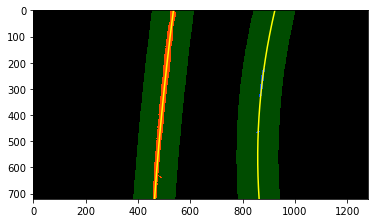

In [31]:
# visualize the result on example image
exampleImg2 = cv2.imread('./test_images/test3.jpg')
exampleImg2_bin = pipeline(exampleImg2)   
margin = 80

left_fit2, right_fit2, left_lane_inds2, right_lane_inds2 = polyfit_using_prev_fit(exampleImg2_bin, left_fit, right_fit)

# Generate x and y values for plotting
ploty = np.linspace(0, exampleImg2_bin.shape[0]-1, exampleImg2_bin.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
left_fitx2 = left_fit2[0]*ploty**2 + left_fit2[1]*ploty + left_fit2[2]
right_fitx2 = right_fit2[0]*ploty**2 + right_fit2[1]*ploty + right_fit2[2]

# Create an image to draw on and an image to show the selection window
out_img = np.uint8(np.dstack((exampleImg2_bin, exampleImg2_bin, exampleImg2_bin))*255)
window_img = np.zeros_like(out_img)

# Color in left and right line pixels
nonzero = exampleImg2_bin.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds2], nonzerox[left_lane_inds2]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds2], nonzerox[right_lane_inds2]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area (OLD FIT)
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx2, ploty, color='yellow')
plt.plot(right_fitx2, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [32]:
## Radius of Curvature

In [33]:
# Method to determine radius of curvature and distance from lane center 
# based on binary image, polynomial fit, and L and R lane pixel indices
def calc_curv_rad_and_center_dist(bin_img, l_fit, r_fit, l_lane_inds, r_lane_inds):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 3.048/100 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    xm_per_pix = 3.7/378 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    left_curverad, right_curverad, center_dist = (0, 0, 0)
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    h = bin_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Again, extract left and right line pixel positions
    leftx = nonzerox[l_lane_inds]
    lefty = nonzeroy[l_lane_inds] 
    rightx = nonzerox[r_lane_inds]
    righty = nonzeroy[r_lane_inds]
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # Now our radius of curvature is in meters
    
    # Distance from center is image x midpoint - mean of l_fit and r_fit intercepts 
    if r_fit is not None and l_fit is not None:
        car_position = bin_img.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix
    return left_curverad, right_curverad, center_dist

In [34]:
rad_l, rad_r, d_center = calc_curv_rad_and_center_dist(exampleImg_bin, left_fit, right_fit, left_lane_inds, right_lane_inds)

print('Radius of curvature for example:', rad_l, 'm,', rad_r, 'm')
print('Distance from lane center for example:', d_center, 'm')


Radius of curvature for example: 1177.46152908 m, 227.524604775 m
Distance from lane center for example: -0.228885325407 m


In [35]:
def draw_lane(original_img, binary_img, l_fit, r_fit, Minv):
    
    #Updated undistored image based on mentor feedback
    
    new_img = np.copy(original_img)
    if l_fit is None or r_fit is None:
        return original_img
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    h,w = binary_img.shape
    ploty = np.linspace(0, h-1, num=h)# to cover same y-range as image
    left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    return result

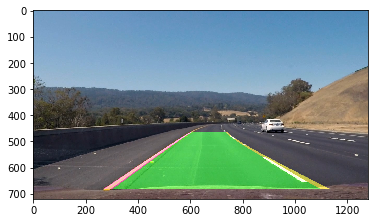

In [36]:
exampleImg_out1 = draw_lane(exampleImg, exampleImg_bin, left_fit, right_fit, MinV)
img_RGB = BGR2RGB(exampleImg_out1)
plt.imshow(img_RGB)


In [37]:
def draw_data(original_img, curv_rad, center_dist):
    new_img = np.copy(original_img)
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Curve radius: ' + '{:04.2f}'.format(curv_rad) + 'm'
    cv2.putText(new_img, text, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(new_img, text, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    return new_img

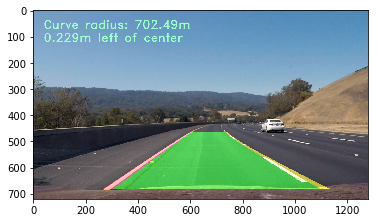

In [38]:
exampleImg_out2 = draw_data(exampleImg_out1, (rad_l+rad_r)/2, d_center)
img_RGB = BGR2RGB(exampleImg_out2)
plt.imshow(img_RGB)

In [39]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #number of detected pixels
        self.px_count = None
    def add_fit(self, fit, inds):
        # add a found fit to the line, up to n
        if fit is not None:
            if self.best_fit is not None:
                # if we have a best fit, see how this new fit compares
                self.diffs = abs(fit-self.best_fit)
            if (self.diffs[0] > 0.001 or \
               self.diffs[1] > 1.0 or \
               self.diffs[2] > 100.) and \
               len(self.current_fit) > 0:
                # bad fit! abort! abort! ... well, unless there are no fits in the current_fit queue, then we'll take it
                self.detected = False
            else:
                self.detected = True
                self.px_count = np.count_nonzero(inds)
                self.current_fit.append(fit)
                if len(self.current_fit) > 5:
                    # throw out old fits, keep newest n
                    self.current_fit = self.current_fit[len(self.current_fit)-5:]
                self.best_fit = np.average(self.current_fit, axis=0)
        # or remove one from the history, if not found
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                # throw out oldest fit
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                # if there are still any fits in the queue, best_fit is their average
                self.best_fit = np.average(self.current_fit, axis=0)


In [40]:
def process_image(img):
    new_img = np.copy(img)
    img_bin = pipeline(new_img, True) #VideoClip returns RGB images not BRG images
    
    # if both left and right lines were detected last frame, use polyfit_using_prev_fit, otherwise use sliding window
    if not l_line.detected or not r_line.detected:
        l_fit, r_fit, l_lane_inds, r_lane_inds, _ = sliding_window_polyfit(img_bin)
    else:
        l_fit, r_fit, l_lane_inds, r_lane_inds = polyfit_using_prev_fit(img_bin, l_line.best_fit, r_line.best_fit)
        
    # invalidate both fits if the difference in their x-intercepts isn't around 350 px (+/- 100 px)
    if l_fit is not None and r_fit is not None:
        # calculate x-intercept (bottom of image, x=image_height) for fits
        h = img.shape[0]
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        x_int_diff = abs(r_fit_x_int-l_fit_x_int)
        if abs(350 - x_int_diff) > 100:
            l_fit = None
            r_fit = None
            
    l_line.add_fit(l_fit, l_lane_inds)
    r_line.add_fit(r_fit, r_lane_inds)
    
    # draw the current best fit if it exists
    if l_line.best_fit is not None and r_line.best_fit is not None:
        img_out1 = draw_lane(new_img, img_bin, l_line.best_fit, r_line.best_fit, MinV)
        rad_l, rad_r, d_center = calc_curv_rad_and_center_dist(img_bin, l_line.best_fit, r_line.best_fit, 
                                                               l_lane_inds, r_lane_inds)
        img_out = draw_data(img_out1, (rad_l+rad_r)/2, d_center)
    else:
        img_out = new_img
    
    diagnostic_output = True
    if diagnostic_output:
        # put together multi-view output
        diag_img = np.zeros((720,1280,3), dtype=np.uint8)
        
        # original output (top left)
        diag_img[0:360,0:640,:] = cv2.resize(img_out,(640,360))
        
        # binary overhead view (top right)
        img_bin = np.dstack((img_bin*255, img_bin*255, img_bin*255))
        resized_img_bin = cv2.resize(img_bin,(640,360))
        diag_img[0:360,640:1280, :] = resized_img_bin
        
        # overhead with all fits added (bottom right)
        img_bin_fit = np.copy(img_bin)
        for i, fit in enumerate(l_line.current_fit):
            img_bin_fit = plot_fit_onto_img(img_bin_fit, fit, (20*i+100,0,20*i+100))
        for i, fit in enumerate(r_line.current_fit):
            img_bin_fit = plot_fit_onto_img(img_bin_fit, fit, (0,20*i+100,20*i+100))
        img_bin_fit = plot_fit_onto_img(img_bin_fit, l_line.best_fit, (255,255,0))
        img_bin_fit = plot_fit_onto_img(img_bin_fit, r_line.best_fit, (255,255,0))
        diag_img[360:720,640:1280,:] = cv2.resize(img_bin_fit,(640,360))
        
        # diagnostic data (bottom left)
        color_ok = (200,255,155)
        color_bad = (255,155,155)
        font = cv2.FONT_HERSHEY_DUPLEX
        if l_fit is not None:
            text = 'This fit L: ' + ' {:0.6f}'.format(l_fit[0]) + \
                                    ' {:0.6f}'.format(l_fit[1]) + \
                                    ' {:0.6f}'.format(l_fit[2])
        else:
            text = 'This fit L: None'
        cv2.putText(diag_img, text, (40,380), font, .5, color_ok, 1, cv2.LINE_AA)
        if r_fit is not None:
            text = 'This fit R: ' + ' {:0.6f}'.format(r_fit[0]) + \
                                    ' {:0.6f}'.format(r_fit[1]) + \
                                    ' {:0.6f}'.format(r_fit[2])
        else:
            text = 'This fit R: None'
        cv2.putText(diag_img, text, (40,400), font, .5, color_ok, 1, cv2.LINE_AA)
        
        
        img_out = diag_img
    return img_out
print('...')


...


In [41]:
def plot_fit_onto_img(img, fit, plot_color):
    if fit is None:
        return img
    new_img = np.copy(img)
    h = new_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    plotx = fit[0]*ploty**2 + fit[1]*ploty + fit[2]
    pts = np.array([np.transpose(np.vstack([plotx, ploty]))])
    cv2.polylines(new_img, np.int32([pts]), isClosed=False, color=plot_color, thickness=8)
    return new_img

In [44]:
l_line = Line()
r_line = Line()

from moviepy.editor import VideoFileClip
from IPython.display import HTML
#my_clip.write_gif('test.gif', fps=12)
video_output1 = 'project_video_output.mp4'
video_input1 = VideoFileClip('project_video.mp4')#.subclip(0,2)
processed_video = video_input1.fl_image(process_image)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████████████████████████████████▉| 1260/1261 [05:27<00:00,  4.13it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

Wall time: 5min 28s


In [45]:
video_input1.reader.close()
video_input1.audio.reader.close_proc()
processed_video.reader.close()

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output1))